<a href="https://colab.research.google.com/github/tsilagava/HackerRank/blob/main/Dog_Breed_Identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Mount

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Imports

In [2]:
import os
import shutil
import time
from tqdm import tqdm


import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.preprocessing import LabelEncoder

import torch
from torchvision import transforms, datasets, models
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.nn.functional as F
from torch.autograd import Variable

In [3]:
path = '/content/drive/MyDrive/Datasets/dog-breed-identification'

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

#Data Labeling

In [4]:
label_df = pd.read_csv(os.path.join(path, 'labels.csv'))
classes = set(label_df.breed)
label_df

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
for class_name in classes:
  path_of_class = os.path.join(f"{path}/train_labeled/", class_name) 
  os.mkdir(path_of_class)

In [ ]:
label_df.head()

In [ ]:
train_images_path = f"{path}/train"
train_images = os.listdir(train_images_path)

for image in tqdm(train_images):
  full_image_name = os.path.join(train_images_path, image)
  if os.path.isfile(full_image_name):
    label_name = label_df.loc[label_df['id'] == image.split('.')[0]].reset_index(drop=True)
    if not label_name.empty:
      label_name = label_name.breed[0]
      dest = os.path.join(f"{path}/train_labeled", label_name)
      if os.path.isdir(dest):
        shutil.copy(full_image_name, dest)

In [ ]:
label_df.loc[label_df['id'] == train_images[0].split('.')[0]].reset_index(drop=True)


,id,breed


#Visualize Random Images

In [ ]:
DATA_PATH = f"{path}/train_labeled"

def load_rand(max_size_from_one_directory=2):
    X=[]
    dir_path=DATA_PATH
    for sub_dir in tqdm(os.listdir(dir_path)):
        path_main=os.path.join(dir_path,sub_dir)
        i=0
        for img_name in os.listdir(path_main):
            if i>=max_size_from_one_directory:
                break
            img=cv2.imread(os.path.join(path_main,img_name))
            img=cv2.resize(img,(200,200))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            X.append([sub_dir, img])
            i+=1
    return X

In [ ]:
X=load_rand()

100%|██████████| 120/120 [01:59<00:00,  1.00it/s]


In [ ]:
X=np.array(X)
X.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  """Entry point for launching an IPython kernel.


(240, 2)

In [ ]:
def show_subpot(X, num_rows=6, num_cols=6):
  if X.shape[0] < num_cols * num_cols:
    raise ValueError('dimension mismatch')
  X_local = np.random.permutation(X)
  f, ax= plt.subplots(num_rows, num_cols, figsize=(40,60))
  for i in range(num_rows):
      for j in range(num_cols):
          ax[i][j].imshow(X_local[i*num_cols+j][1], aspect='auto')
          ax[i][j].set_title(X_local[i*num_cols+j][0])
  plt.show()

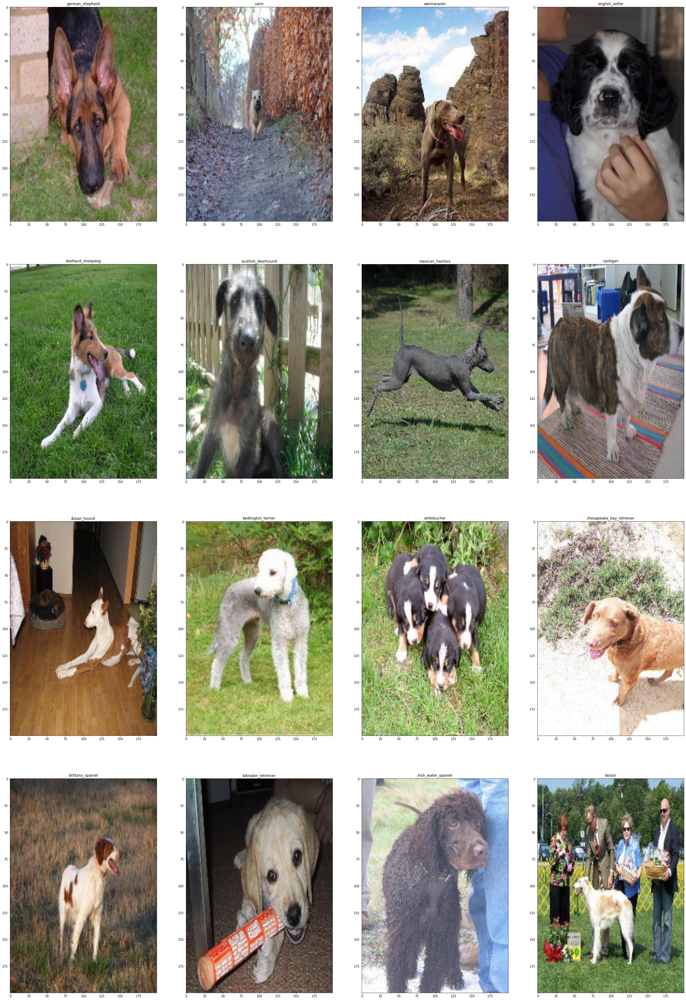

In [ ]:
show_subpot(X[0:16], 4 ,4)

#Load Data

In [5]:
def get_train_data_loader(folder_name, transform, batch_size):
  DATA_PATH = os.path.join(path, folder_name)
  tfms = transform
  data = datasets.ImageFolder(DATA_PATH, transform=tfms)
  data_loader = DataLoader(data, batch_size=batch_size, shuffle=True, num_workers=0)
  return data_loader

In [ ]:
tfms = transforms.Compose([transforms.Resize((200, 200)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

data_loader = get_train_data_loader(folder_name='train_labeled',transform=tfms, batch_size=64)

In [6]:
tfms = transforms.Compose([transforms.Resize((224, 224)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

data_loader = get_train_data_loader(folder_name='train_labeled',transform=tfms, batch_size=64)

In [7]:
def get_train_and_valid_data_loaders(train_folder_name, valid_folder_name, train_transform, valid_trainsform, batch_size):
  TRAIN_PATH = os.path.join(path, train_folder_name)
  VALID_PATH = os.path.join(path, valid_folder_name)

  train_data = datasets.ImageFolder(TRAIN_PATH, transform=train_transform)
  train_data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=4)

  valid_data = datasets.ImageFolder(VALID_PATH, transform=valid_trainsform)
  valid_data_loader = DataLoader(valid_data, batch_size=batch_size, shuffle=False, num_workers=4)

  return train_data_loader, valid_data_loader

In [ ]:
tfms = transforms.Compose([transforms.Resize((200, 200)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader, valid_loader = get_train_and_valid_data_loaders(
    train_folder_name='train_folders',
    valid_folder_name='valid_folders',
    train_transform=tfms,
    valid_trainsform=tfms, 
    batch_size=64)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [8]:
tfms = transforms.Compose([transforms.Resize((224, 224)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader, valid_loader = get_train_and_valid_data_loaders(
    train_folder_name='train_folders',
    valid_folder_name='valid_folders',
    train_transform=tfms,
    valid_trainsform=tfms, 
    batch_size=64)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


# Distribution of Classes

In [ ]:
from collections import Counter
distribution = dict(Counter(data.targets))

<BarContainer object of 120 artists>

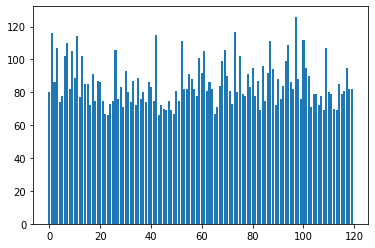

In [ ]:
keys = distribution.keys()
values = distribution.values()
plt.bar(keys, values)

In [ ]:
def get_distribution(x):
  res = {}
  i = 0
  for _, cl in x:
    if not cl in res.keys():
      res [cl] = 0
    res[cl] += 1
  return res

In [ ]:
def get_idx_to_class(class_do_idx):
  idx_to_class = {}
  for i in class_to_idx:
    idx_to_class[class_to_idx[i]] = i

In [ ]:
def plot_distribution(target):
  keys = target.keys()
  values = target.values()
  plt.bar(keys, values)

In [ ]:
train_set_dist = get_distribution(train_set)

In [ ]:
plot_distribution(train_set_dist)

In [ ]:
test_set_dist = get_distribution(test_set)

In [ ]:
plot_distribution(test_set_dist)

#Model

In [ ]:
train_tfms = transforms.Compose([transforms.RandomVerticalFlip(0.5), 
                                 transforms.RandomHorizontalFlip(0.5),
                                 transforms.RandomRotation(40,expand=False),
                                 transforms.Resize((210, 210)),
                                 transforms.RandomCrop((200,200)),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

valid_tfms = transforms.Compose([transforms.Resize((200, 200)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

train_loader, valid_loader = get_train_and_valid_data_loaders(
    train_folder_name='train_folders',
    valid_folder_name='valid_folders',
    train_transform=train_tfms,
    valid_trainsform=valid_tfms, 
    batch_size=64)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
def get_height_and_width(h, w, 
                         kernel_size, use_pooling=False, pooling_ker_size=None, pooling_stride=None, 
                         padding=0, dilation=1, stride=1,
                         pooling_padding=0, poolin_dilation=1):
  res_h, res_w = h, w
  if padding != 'same':   
    res_h = ((h+2*padding-dilation*(kernel_size-1)-1)/stride + 1)
    res_w = ((w+2*padding-dilation*(kernel_size-1)-1)/stride + 1)
  if pooling_ker_size!=None:
    if pooling_stride == None:
      pooling_stride = pooling_ker_size
    res_h = ((res_h+2*pooling_padding-poolin_dilation*(pooling_ker_size-1)-1)/pooling_stride + 1)
    res_w = ((res_w+2*pooling_padding-poolin_dilation*(pooling_ker_size-1)-1)/pooling_stride + 1)
  return (int(res_h), int(res_w))

In [ ]:
class Net(nn.Module):
  def __init__(self):
    super().__init__()
    h, w = 200, 200
    self.conv1 = nn.Conv2d(3, 32, 4, padding=2)
    h, w = get_height_and_width(h, w, 4, padding=2, pooling_ker_size=2)
    self.conv2 = nn.Conv2d(32, 32, 3, padding=1)
    h, w = get_height_and_width(h, w, 3, padding=1, pooling_ker_size=2)
    self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
    h, w = get_height_and_width(h, w, 3, padding=1, pooling_ker_size=2)
    self.conv4 = nn.Conv2d(64, 64, 2, padding=1)
    h, w = get_height_and_width(h, w, 2, padding=1, pooling_ker_size=2)

    self.conv5 = nn.Conv2d(64, 128,2)
    h, w = get_height_and_width(h, w, 2, pooling_ker_size=2)
    self.conv6 = nn.Conv2d(128, 128, 2)
    h, w = get_height_and_width(h, w, 2, pooling_ker_size=2)

    self.conv_bn1 = nn.BatchNorm2d(32)
    self.conv_bn2 = nn.BatchNorm2d(64)
    self.conv_bn3 = nn.BatchNorm2d(128)

    self.conv_dropout1 = nn.Dropout2d(0.3)
    self.conv_dropout2 = nn.Dropout2d(0.4)
    self.conv_dropout3 = nn.Dropout2d(0.5)

    print(h, w)
    self.fc1 = nn.Linear(int(128 * 2 * 2), 256)

    self.fc3 = nn.Linear(256, 120)

    self.fc_dropout1 = nn.Dropout(0.3)

    self.max_pool = nn.MaxPool2d(2)

    self.adap_max_pool_100 = nn.AdaptiveMaxPool2d(100)
    self.adap_max_pool_50 = nn.AdaptiveMaxPool2d(50)
    self.adap_max_pool_25 = nn.AdaptiveMaxPool2d(25)
    self.adap_max_pool_12 = nn.AdaptiveMaxPool2d(12)
    self.adap_max_pool_6 = nn.AdaptiveMaxPool2d(6)
    self.adap_max_pool_2 = nn.AdaptiveMaxPool2d(2)

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = self.adap_max_pool_100(x)

    x = F.relu(self.conv2(x))
    x = self.adap_max_pool_50(x)
    x = self.conv_bn1(x)
    x = self.conv_dropout1(x)

    x = F.relu(self.conv3(x))
    x = self.adap_max_pool_25(x)

    x = F.relu(self.conv4(x))
    x = self.adap_max_pool_12(x)
    x = self.conv_bn2(x)
    x = self.conv_dropout2(x)

    x = F.relu(self.conv5(x))
    x = self.adap_max_pool_6(x)

    x = F.relu(self.conv6(x))
    x = self.adap_max_pool_2(x)
    x = self.conv_bn3(x)
    x = self.conv_dropout3(x)

    x = torch.flatten(x, start_dim=1)

    x = F.relu(self.fc1(x))
    x = self.fc_dropout1(x)

    x = self.fc3(x)

    return x

In [ ]:
def sequential_model():
  return nn.Sequential(
    nn.Conv2d(3, 32, 4, padding=2),
    nn.ReLU(),
    nn.AdaptiveMaxPool2d(100),

    nn.Conv2d(32, 32, 3, padding=1),
    nn.ReLU(),
    nn.AdaptiveMaxPool2d(50),
    nn.BatchNorm2d(32),
    nn.Dropout2d(0.3), 

    nn.Conv2d(32, 64, 3, padding=1),
    nn.ReLU(),
    nn.AdaptiveMaxPool2d(25),

    nn.Conv2d(64, 64, 3, padding=1),
    nn.ReLU(),
    nn.AdaptiveMaxPool2d(12),
    nn.BatchNorm2d(64),
    nn.Dropout2d(0.4),  

    nn.Conv2d(64, 128, 3, padding=0),
    nn.ReLU(),
    nn.AdaptiveMaxPool2d(6),

    nn.Conv2d(128, 128, 3, padding=0),
    nn.ReLU(),
    nn.AdaptiveMaxPool2d(2),
    nn.BatchNorm2d(128),
    nn.Dropout2d(0.5),  

    nn.Flatten(),
  
    nn.Linear(int(128*2*2), 1024),
    nn.ReLU(),
    nn.Dropout(0.3),

    nn.Linear(1024, 120)
)

In [ ]:
epochs = 40

net = Net()
net.to(device)

# net = sequential_model()
# net.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters())

net = train_basic_model(net, optimizer, criterion, train_loader, valid_loader, epochs)

2 2


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
0it [00:00, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
26it [01:42,  3.23s/it]

[1,    25] loss: 4.859


50it [03:08,  2.52s/it]

[1,    50] loss: 4.812


76it [04:49,  2.02s/it]

[1,    75] loss: 4.788


100it [06:16,  1.97s/it]

[1,   100] loss: 4.763


126it [07:52,  3.64s/it]

[1,   125] loss: 4.680


134it [08:19,  3.72s/it]


Epoch: 1 	Training Loss: 4.773692 	Validation Loss: 4.684709


25it [00:13,  2.86it/s]

[2,    25] loss: 4.617


51it [00:26,  1.92it/s]

[2,    50] loss: 4.584


76it [00:38,  2.21it/s]

[2,    75] loss: 4.603


100it [00:49,  2.39it/s]

[2,   100] loss: 4.591


125it [01:00,  2.67it/s]

[2,   125] loss: 4.528


134it [01:04,  2.09it/s]


Epoch: 2 	Training Loss: 4.585041 	Validation Loss: 4.469640


26it [00:12,  2.26it/s]

[3,    25] loss: 4.491


50it [00:24,  1.94it/s]

[3,    50] loss: 4.477


76it [00:35,  2.80it/s]

[3,    75] loss: 4.485


100it [00:47,  3.09it/s]

[3,   100] loss: 4.482


125it [00:59,  1.66it/s]

[3,   125] loss: 4.495


134it [01:02,  2.13it/s]


Epoch: 3 	Training Loss: 4.485306 	Validation Loss: 4.393830


25it [00:12,  2.42it/s]

[4,    25] loss: 4.384


51it [00:25,  2.10it/s]

[4,    50] loss: 4.438


76it [00:37,  2.49it/s]

[4,    75] loss: 4.412


101it [00:48,  2.75it/s]

[4,   100] loss: 4.404


125it [00:59,  3.30it/s]

[4,   125] loss: 4.413


134it [01:03,  2.12it/s]


Epoch: 4 	Training Loss: 4.409901 	Validation Loss: 4.307365


25it [00:12,  2.21it/s]

[5,    25] loss: 4.341


50it [00:24,  1.63it/s]

[5,    50] loss: 4.367


76it [00:36,  2.31it/s]

[5,    75] loss: 4.370


100it [00:47,  2.18it/s]

[5,   100] loss: 4.356


126it [00:59,  3.00it/s]

[5,   125] loss: 4.349


134it [01:02,  2.14it/s]


Epoch: 5 	Training Loss: 4.355038 	Validation Loss: 4.324218


26it [00:12,  3.02it/s]

[6,    25] loss: 4.303


50it [00:25,  2.85it/s]

[6,    50] loss: 4.357


76it [00:37,  2.31it/s]

[6,    75] loss: 4.301


101it [00:49,  2.52it/s]

[6,   100] loss: 4.296


126it [01:00,  2.99it/s]

[6,   125] loss: 4.290


134it [01:03,  2.11it/s]


Epoch: 6 	Training Loss: 4.308795 	Validation Loss: 4.305120


25it [00:12,  2.85it/s]

[7,    25] loss: 4.303


51it [00:25,  2.03it/s]

[7,    50] loss: 4.280


75it [00:36,  2.09it/s]

[7,    75] loss: 4.263


100it [00:48,  1.89it/s]

[7,   100] loss: 4.287


125it [00:59,  2.65it/s]

[7,   125] loss: 4.236


134it [01:03,  2.11it/s]


Epoch: 7 	Training Loss: 4.271443 	Validation Loss: 4.206229


25it [00:12,  3.09it/s]

[8,    25] loss: 4.254


51it [00:25,  1.95it/s]

[8,    50] loss: 4.230


76it [00:36,  2.83it/s]

[8,    75] loss: 4.254


101it [00:49,  3.18it/s]

[8,   100] loss: 4.292


125it [01:00,  3.01it/s]

[8,   125] loss: 4.273


134it [01:03,  2.12it/s]


Epoch: 8 	Training Loss: 4.257086 	Validation Loss: 4.238032


25it [00:13,  1.70it/s]

[9,    25] loss: 4.218


50it [00:25,  2.57it/s]

[9,    50] loss: 4.246


76it [00:38,  1.98it/s]

[9,    75] loss: 4.218


101it [00:50,  2.43it/s]

[9,   100] loss: 4.206


126it [01:03,  2.58it/s]

[9,   125] loss: 4.264


134it [01:05,  2.05it/s]


Epoch: 9 	Training Loss: 4.231991 	Validation Loss: 4.200605


25it [00:12,  1.81it/s]

[10,    25] loss: 4.215


50it [00:23,  2.67it/s]

[10,    50] loss: 4.207


75it [00:35,  2.90it/s]

[10,    75] loss: 4.192


100it [00:48,  2.38it/s]

[10,   100] loss: 4.231


126it [00:59,  3.11it/s]

[10,   125] loss: 4.201


134it [01:03,  2.12it/s]


Epoch: 10 	Training Loss: 4.209294 	Validation Loss: 4.210920


26it [00:13,  2.21it/s]

[11,    25] loss: 4.176


50it [00:24,  2.49it/s]

[11,    50] loss: 4.180


76it [00:37,  1.83it/s]

[11,    75] loss: 4.125


101it [00:49,  2.31it/s]

[11,   100] loss: 4.155


126it [01:01,  3.01it/s]

[11,   125] loss: 4.129


134it [01:04,  2.08it/s]


Epoch: 11 	Training Loss: 4.158988 	Validation Loss: 4.126636


26it [00:14,  1.69it/s]

[12,    25] loss: 4.128


51it [00:25,  2.33it/s]

[12,    50] loss: 4.166


76it [00:37,  2.40it/s]

[12,    75] loss: 4.139


101it [00:48,  3.01it/s]

[12,   100] loss: 4.163


125it [01:00,  2.89it/s]

[12,   125] loss: 4.160


134it [01:03,  2.11it/s]


Epoch: 12 	Training Loss: 4.153077 	Validation Loss: 4.090299


26it [00:14,  1.86it/s]

[13,    25] loss: 4.141


51it [00:25,  2.51it/s]

[13,    50] loss: 4.165


76it [00:37,  2.96it/s]

[13,    75] loss: 4.124


100it [00:48,  3.20it/s]

[13,   100] loss: 4.103


126it [01:01,  2.09it/s]

[13,   125] loss: 4.178


134it [01:03,  2.12it/s]


Epoch: 13 	Training Loss: 4.141887 	Validation Loss: 4.079688


26it [00:12,  2.77it/s]

[14,    25] loss: 4.061


50it [00:24,  2.18it/s]

[14,    50] loss: 4.159


76it [00:36,  2.83it/s]

[14,    75] loss: 4.061


100it [00:47,  2.74it/s]

[14,   100] loss: 4.133


126it [01:01,  2.10it/s]

[14,   125] loss: 4.143


134it [01:03,  2.11it/s]


Epoch: 14 	Training Loss: 4.112303 	Validation Loss: 4.052747


26it [00:13,  1.92it/s]

[15,    25] loss: 4.069


50it [00:24,  2.05it/s]

[15,    50] loss: 4.085


76it [00:36,  2.94it/s]

[15,    75] loss: 4.085


100it [00:47,  3.20it/s]

[15,   100] loss: 4.100


126it [01:00,  2.18it/s]

[15,   125] loss: 4.083


134it [01:03,  2.12it/s]


Epoch: 15 	Training Loss: 4.090193 	Validation Loss: 4.038172


25it [00:13,  1.76it/s]

[16,    25] loss: 4.057


50it [00:24,  1.65it/s]

[16,    50] loss: 4.102


75it [00:36,  2.28it/s]

[16,    75] loss: 4.116


100it [00:48,  2.31it/s]

[16,   100] loss: 4.047


125it [01:00,  2.29it/s]

[16,   125] loss: 4.084


134it [01:03,  2.12it/s]


Epoch: 16 	Training Loss: 4.078209 	Validation Loss: 3.992175


26it [00:13,  1.97it/s]

[17,    25] loss: 4.043


50it [00:24,  1.92it/s]

[17,    50] loss: 4.066


76it [00:36,  2.18it/s]

[17,    75] loss: 4.037


100it [00:47,  2.65it/s]

[17,   100] loss: 4.022


125it [00:59,  3.01it/s]

[17,   125] loss: 4.022


134it [01:02,  2.13it/s]


Epoch: 17 	Training Loss: 4.044203 	Validation Loss: 3.996215


26it [00:14,  1.79it/s]

[18,    25] loss: 3.949


51it [00:26,  2.29it/s]

[18,    50] loss: 4.025


76it [00:37,  3.01it/s]

[18,    75] loss: 4.072


100it [00:48,  2.45it/s]

[18,   100] loss: 4.033


126it [01:00,  2.17it/s]

[18,   125] loss: 4.047


134it [01:03,  2.11it/s]


Epoch: 18 	Training Loss: 4.025450 	Validation Loss: 3.969693


26it [00:13,  2.24it/s]

[19,    25] loss: 3.964


50it [00:24,  2.13it/s]

[19,    50] loss: 4.038


75it [00:35,  2.41it/s]

[19,    75] loss: 4.031


100it [00:48,  1.94it/s]

[19,   100] loss: 4.063


126it [01:00,  2.70it/s]

[19,   125] loss: 4.061


134it [01:04,  2.09it/s]


Epoch: 19 	Training Loss: 4.029814 	Validation Loss: 3.981125


25it [00:13,  1.95it/s]

[20,    25] loss: 4.019


51it [00:26,  2.01it/s]

[20,    50] loss: 3.959


76it [00:37,  2.54it/s]

[20,    75] loss: 3.982


101it [00:50,  2.97it/s]

[20,   100] loss: 4.022


125it [01:01,  2.94it/s]

[20,   125] loss: 4.051


134it [01:04,  2.07it/s]


Epoch: 20 	Training Loss: 4.008409 	Validation Loss: 4.011224


25it [00:12,  1.99it/s]

[21,    25] loss: 3.941


51it [00:24,  2.21it/s]

[21,    50] loss: 3.968


76it [00:35,  2.55it/s]

[21,    75] loss: 4.013


100it [00:46,  2.94it/s]

[21,   100] loss: 3.983


126it [00:59,  2.07it/s]

[21,   125] loss: 4.011


134it [01:02,  2.15it/s]


Epoch: 21 	Training Loss: 3.985143 	Validation Loss: 3.907849


26it [00:13,  2.06it/s]

[22,    25] loss: 3.944


50it [00:24,  2.72it/s]

[22,    50] loss: 3.978


76it [00:37,  2.05it/s]

[22,    75] loss: 3.949


100it [00:48,  1.95it/s]

[22,   100] loss: 3.962


126it [01:00,  3.16it/s]

[22,   125] loss: 4.027


134it [01:03,  2.11it/s]


Epoch: 22 	Training Loss: 3.971148 	Validation Loss: 3.898246


26it [00:13,  2.14it/s]

[23,    25] loss: 3.937


51it [00:25,  2.54it/s]

[23,    50] loss: 3.948


76it [00:37,  2.96it/s]

[23,    75] loss: 3.933


100it [00:48,  2.86it/s]

[23,   100] loss: 3.959


126it [01:01,  2.00it/s]

[23,   125] loss: 3.943


134it [01:04,  2.09it/s]


Epoch: 23 	Training Loss: 3.947306 	Validation Loss: 3.886595


26it [00:14,  1.70it/s]

[24,    25] loss: 3.882


51it [00:25,  2.87it/s]

[24,    50] loss: 4.000


76it [00:37,  3.04it/s]

[24,    75] loss: 3.911


100it [00:49,  3.07it/s]

[24,   100] loss: 3.980


126it [01:02,  1.91it/s]

[24,   125] loss: 4.006


134it [01:05,  2.06it/s]


Epoch: 24 	Training Loss: 3.958102 	Validation Loss: 3.851651


26it [00:13,  2.43it/s]

[25,    25] loss: 3.873


50it [00:24,  3.11it/s]

[25,    50] loss: 3.917


76it [00:38,  1.88it/s]

[25,    75] loss: 3.916


101it [00:49,  2.34it/s]

[25,   100] loss: 3.956


126it [01:01,  3.21it/s]

[25,   125] loss: 3.948


134it [01:03,  2.10it/s]


Epoch: 25 	Training Loss: 3.921221 	Validation Loss: 3.861150


26it [00:13,  1.98it/s]

[26,    25] loss: 3.885


51it [00:25,  2.63it/s]

[26,    50] loss: 3.933


76it [00:36,  3.06it/s]

[26,    75] loss: 3.960


100it [00:48,  2.46it/s]

[26,   100] loss: 3.886


125it [01:00,  2.92it/s]

[26,   125] loss: 3.959


134it [01:03,  2.11it/s]


Epoch: 26 	Training Loss: 3.925896 	Validation Loss: 3.866252


25it [00:12,  2.55it/s]

[27,    25] loss: 3.892


51it [00:26,  2.02it/s]

[27,    50] loss: 3.880


76it [00:37,  2.46it/s]

[27,    75] loss: 3.940


100it [00:49,  2.46it/s]

[27,   100] loss: 3.925


125it [01:00,  2.97it/s]

[27,   125] loss: 3.920


134it [01:04,  2.09it/s]


Epoch: 27 	Training Loss: 3.909883 	Validation Loss: 3.826862


25it [00:12,  2.35it/s]

[28,    25] loss: 3.911


51it [00:25,  1.92it/s]

[28,    50] loss: 3.880


76it [00:37,  2.34it/s]

[28,    75] loss: 3.869


101it [00:49,  2.88it/s]

[28,   100] loss: 3.838


125it [01:01,  2.89it/s]

[28,   125] loss: 3.937


134it [01:04,  2.08it/s]


Epoch: 28 	Training Loss: 3.887985 	Validation Loss: 3.811115


25it [00:13,  2.12it/s]

[29,    25] loss: 3.878


51it [00:26,  1.67it/s]

[29,    50] loss: 3.850


76it [00:37,  2.46it/s]

[29,    75] loss: 3.855


100it [00:49,  2.50it/s]

[29,   100] loss: 3.954


125it [01:00,  2.92it/s]

[29,   125] loss: 3.880


134it [01:04,  2.08it/s]


Epoch: 29 	Training Loss: 3.885522 	Validation Loss: 3.793080


26it [00:14,  2.03it/s]

[30,    25] loss: 3.821


51it [00:25,  2.82it/s]

[30,    50] loss: 3.832


76it [00:37,  3.18it/s]

[30,    75] loss: 3.932


100it [00:48,  3.16it/s]

[30,   100] loss: 3.892


126it [01:01,  2.23it/s]

[30,   125] loss: 3.819


134it [01:03,  2.10it/s]


Epoch: 30 	Training Loss: 3.862329 	Validation Loss: 3.812841


25it [00:12,  2.40it/s]

[31,    25] loss: 3.883


51it [00:24,  2.66it/s]

[31,    50] loss: 3.890


75it [00:36,  1.94it/s]

[31,    75] loss: 3.842


100it [00:49,  1.48it/s]

[31,   100] loss: 3.811


126it [01:01,  2.49it/s]

[31,   125] loss: 3.848


134it [01:03,  2.10it/s]


Epoch: 31 	Training Loss: 3.859518 	Validation Loss: 3.766860


26it [00:13,  2.15it/s]

[32,    25] loss: 3.779


50it [00:24,  2.10it/s]

[32,    50] loss: 3.854


76it [00:36,  2.71it/s]

[32,    75] loss: 3.895


100it [00:48,  2.78it/s]

[32,   100] loss: 3.814


126it [01:00,  2.63it/s]

[32,   125] loss: 3.828


134it [01:03,  2.11it/s]


Epoch: 32 	Training Loss: 3.836404 	Validation Loss: 3.781264


25it [00:12,  2.25it/s]

[33,    25] loss: 3.803


51it [00:25,  2.30it/s]

[33,    50] loss: 3.815


76it [00:36,  2.72it/s]

[33,    75] loss: 3.885


100it [00:47,  2.54it/s]

[33,   100] loss: 3.840


125it [00:59,  2.67it/s]

[33,   125] loss: 3.884


134it [01:03,  2.12it/s]


Epoch: 33 	Training Loss: 3.847131 	Validation Loss: 3.769850


25it [00:12,  2.22it/s]

[34,    25] loss: 3.739


51it [00:24,  2.69it/s]

[34,    50] loss: 3.762


75it [00:35,  2.82it/s]

[34,    75] loss: 3.849


101it [00:49,  1.99it/s]

[34,   100] loss: 3.832


126it [01:00,  2.26it/s]

[34,   125] loss: 3.887


134it [01:03,  2.11it/s]


Epoch: 34 	Training Loss: 3.822179 	Validation Loss: 3.781206


26it [00:13,  2.20it/s]

[35,    25] loss: 3.749


51it [00:24,  2.74it/s]

[35,    50] loss: 3.775


76it [00:36,  2.84it/s]

[35,    75] loss: 3.797


100it [00:47,  2.29it/s]

[35,   100] loss: 3.827


126it [01:00,  2.83it/s]

[35,   125] loss: 3.837


134it [01:03,  2.12it/s]


Epoch: 35 	Training Loss: 3.797186 	Validation Loss: 3.751296


26it [00:13,  2.03it/s]

[36,    25] loss: 3.785


50it [00:23,  2.21it/s]

[36,    50] loss: 3.788


76it [00:35,  2.96it/s]

[36,    75] loss: 3.753


100it [00:47,  2.91it/s]

[36,   100] loss: 3.821


126it [01:00,  1.98it/s]

[36,   125] loss: 3.778


134it [01:02,  2.14it/s]


Epoch: 36 	Training Loss: 3.789067 	Validation Loss: 3.757379


26it [00:13,  2.64it/s]

[37,    25] loss: 3.735


50it [00:25,  2.38it/s]

[37,    50] loss: 3.740


76it [00:37,  2.02it/s]

[37,    75] loss: 3.780


100it [00:48,  2.19it/s]

[37,   100] loss: 3.850


126it [01:00,  2.06it/s]

[37,   125] loss: 3.774


134it [01:02,  2.13it/s]


Epoch: 37 	Training Loss: 3.778162 	Validation Loss: 3.742904


26it [00:12,  2.47it/s]

[38,    25] loss: 3.676


51it [00:24,  1.92it/s]

[38,    50] loss: 3.759


76it [00:35,  2.77it/s]

[38,    75] loss: 3.806


101it [00:47,  2.79it/s]

[38,   100] loss: 3.792


125it [00:59,  2.07it/s]

[38,   125] loss: 3.814


134it [01:02,  2.13it/s]


Epoch: 38 	Training Loss: 3.769611 	Validation Loss: 3.719280


25it [00:12,  1.69it/s]

[39,    25] loss: 3.660


51it [00:25,  2.32it/s]

[39,    50] loss: 3.749


76it [00:36,  2.98it/s]

[39,    75] loss: 3.801


100it [00:48,  3.11it/s]

[39,   100] loss: 3.810


126it [01:01,  2.09it/s]

[39,   125] loss: 3.715


134it [01:03,  2.12it/s]


Epoch: 39 	Training Loss: 3.748787 	Validation Loss: 3.691623


25it [00:12,  2.46it/s]

[40,    25] loss: 3.759


51it [00:25,  1.98it/s]

[40,    50] loss: 3.763


76it [00:36,  2.60it/s]

[40,    75] loss: 3.750


100it [00:48,  2.04it/s]

[40,   100] loss: 3.748


126it [01:00,  1.88it/s]

[40,   125] loss: 3.773


134it [01:02,  2.13it/s]


Epoch: 40 	Training Loss: 3.760359 	Validation Loss: 3.706699


In [ ]:
def train_basic_model(model, optimizer, criterion, train_loader, valid_loader, epochs=7):
  train_losses = []
  valid_losses = []

  for epoch in range(epochs):
    train_loss = 0.0
    valid_loss = 0.0

    running_loss = 0.0

    # train
    i = 0
    model.train()
    for i, data in tqdm(enumerate(train_loader, 0)):
      inputs, labels = data[0].to(device), data[1].to(device)
      # print(i)

      optimizer.zero_grad()

      # forward + backward + optimize
      outputs = model(inputs)
      loss = criterion(outputs, labels)
      loss.backward()
      optimizer.step()

      train_loss += loss.item() * inputs.size(0)

      # print statistics
      running_loss += loss.item()
      if i % 25 == 24:    # print every 25 mini-batches
          print('[%d, %5d] loss: %.3f' %
                (epoch + 1, i + 1, running_loss / 25))
          running_loss = 0.0

    # validation
    model.eval()
    j = 0
    with torch.no_grad():
      for j, data in enumerate(valid_loader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)
          
        output = model(inputs)
        
        loss = criterion(output, labels)
        
        # update-average-validation-loss 
        valid_loss += loss.item() * inputs.size(0)

    train_loss = train_loss/len(train_loader.sampler)
    valid_loss = valid_loss/len(valid_loader.sampler)
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(epoch + 1, train_loss, valid_loss))

  return model

# Transfer Learning

In [9]:
transfer_model = models.resnet50(pretrained=True)
num_features = transfer_model.fc.in_features

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [ ]:
classes

In [10]:
transfer_model.fc = nn.Linear(num_features, len(classes))
transfer_model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [11]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(transfer_model.parameters(), lr=0.01, momentum=0.8)

In [12]:
def train_model(model, criterion, optimizer, num_epochs=1):
  for epoch in range(num_epochs):

    train_loss = 0.0
    valid_loss = 0.0

    model.train()
    for i, (inputs, labels) in enumerate(train_loader):
      inputs = inputs.to(device)
      labels = labels.to(device)

      # forward
      outputs = model(inputs)
      _, preds = torch.max(outputs, 1)
      loss = criterion(outputs, labels)

      # backward
      loss.backward()
      optimizer.step()
      optimizer.zero_grad()

      train_loss += loss.item()
      if (i+1) % len(train_loader) == 0:
        print(f'train loss: epoch {epoch+1}, loss = {train_loss/(i+1)}')
        

    model.eval()
    with torch.no_grad():
      for j, (inputs, labels) in enumerate(valid_loader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)

        loss = criterion(outputs, labels)

        valid_loss += loss.item()
        if (j+1) % len(valid_loader) == 0:
          print(f'valid loss: epoch {epoch+1}, loss = {valid_loss/(j+1)}')
        

  return model


In [15]:
model = train_model(transfer_model, criterion, optimizer, num_epochs=2)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


train loss: epoch 1, loss = 0.022598567564707638
valid loss: epoch 1, loss = 0.6003393188670829
train loss: epoch 2, loss = 0.01685642998026156
valid loss: epoch 2, loss = 0.6048714474395469


#Save model

In [16]:
MODEL_PATH = f"{path}/dog-breed-identification-transfer_model_v12.pt"

In [ ]:
torch.save(net.state_dict(), MODEL_PATH)

In [17]:
torch.save(model.state_dict(), MODEL_PATH)

#Load Model

In [ ]:
model = Net()
model.load_state_dict(torch.load(MODEL_PATH))
model.to(device)
# if torch.cuda.is_available():
#   net.to(device)

4 4


Net(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (conv5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (conv_bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_dropout1): Dropout2d(p=0.3, inplace=False)
  (conv_dropout2): Dropout2d(p=0.4, inplace=False)
  (fc1): Linear(in_features=2048, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=120, bias=True)
  (fc_dropout1): Dropout(p=0.3, inplace=False)
  (max_pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=Fal

In [18]:
model.load_state_dict(torch.load(MODEL_PATH))
model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

#Create Test CSV

In [ ]:
test_tfms = transforms.Compose([transforms.Resize((200, 200)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])


In [19]:
test_tfms = transforms.Compose([transforms.Resize((224, 224)),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [20]:
class DogsDataset(Dataset):
    """Dog breed identification dataset."""

    def __init__(self, img_dir, dataframe, transform=None):
        """
        Args:
            img_dir (string): Directory with all the images.        
            dataframe (pandas.core.frame.DataFrame): Pandas dataframe obtained
                by read_csv().
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.labels_frame = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.labels_frame)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.labels_frame.id[idx]) + ".jpg"
        image = Image.open(img_name)
        label = self.labels_frame.target[idx]

        if self.transform:
            image = self.transform(image)

        return [image, label] 



In [21]:
def test_sumission(model):
    since = time.time()
    sub_outputs = []
    model.train(False)  # Set model to evaluate mode
    # Iterate over data.
    for data in sub_loader:
        # get the inputs
        inputs, labels = data

        inputs = Variable(inputs.type(Tensor))
        labels = Variable(labels.type(LongTensor))

        # forward
        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)
        sub_outputs.append(outputs.data.cpu().numpy())

    sub_outputs = np.concatenate(sub_outputs)
    for idx,row in enumerate(sub_outputs.astype(float)):
        sub_outputs[idx] = np.exp(row)/np.sum(np.exp(row))

    output_df.loc[:,1:] = sub_outputs
        
    print()
    time_elapsed = time.time() - since
    print('Run complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

    return output_df

In [22]:
SAMPLE_SUB_PATH = f"{path}/sample_submission.csv"
TEST_IMG_PATH = f"{path}/test"

submission_df = pd.read_csv(SAMPLE_SUB_PATH)
output_df = pd.DataFrame(index=submission_df.index, columns=submission_df.keys() )
output_df['id'] = submission_df['id']
submission_df['target'] =  [0] * len(submission_df)

submission_ds = DogsDataset(TEST_IMG_PATH, submission_df, test_tfms)

sub_loader = DataLoader(submission_ds, batch_size=4,
                        shuffle=False, num_workers=4)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    use_gpu = True
    print("Using GPU")
else:
    use_gpu = False
FloatTensor = torch.cuda.FloatTensor if use_gpu else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_gpu else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_gpu else torch.ByteTensor
Tensor = FloatTensor


odf = test_sumission(model)
odf.to_csv(f"{path}/dogs_id_v12.csv", index=False)

Using GPU


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.



Run complete in 22m 14s


In [ ]:
model

In [ ]:
use_gpu

True